<a href="https://colab.research.google.com/github/gandalfmuda/Data-Scientis-mastery/blob/main/A%20Ships%20Detect%20A.I./A_I_Ship_Detection_With_YOLOv5.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>



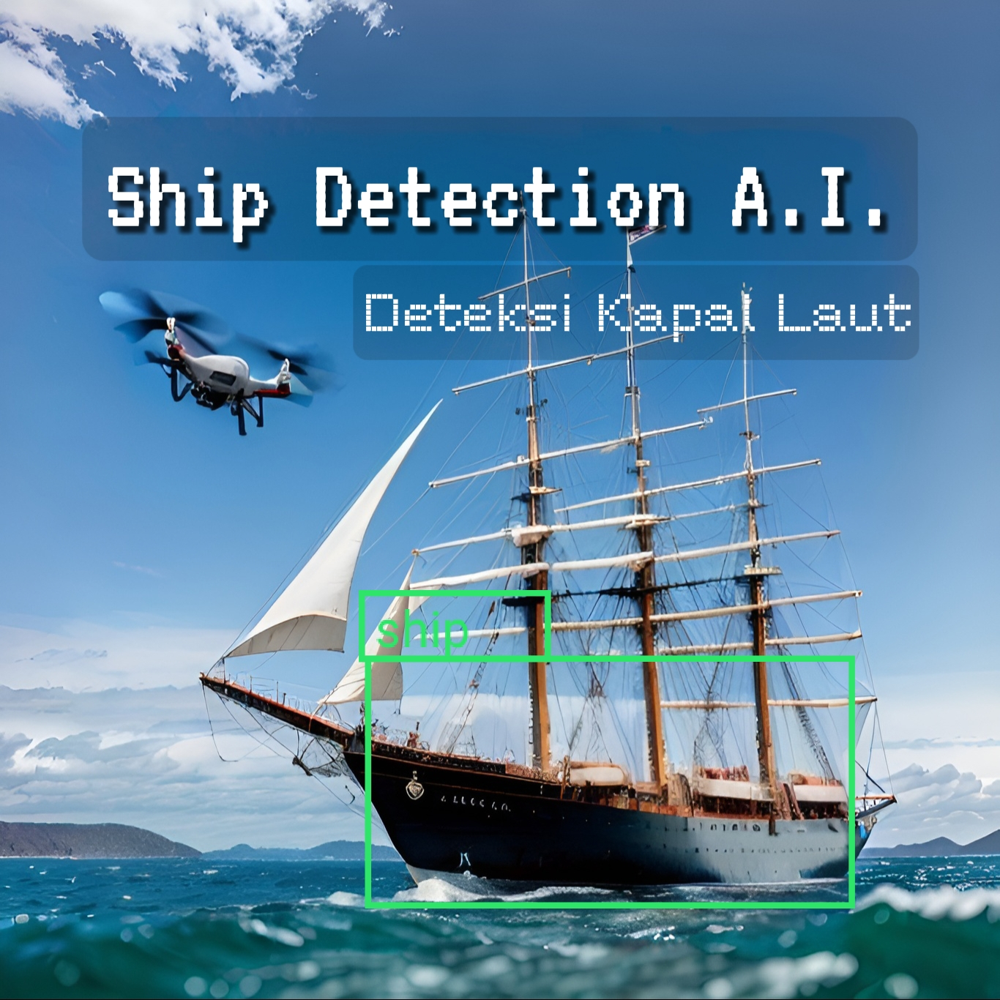









<a>`KKPGOID, Kmenhan, BRIN`</a>

**Disini saya mencoba mendeteksi objek kapal laut dari atas menggunakan objek gambar dari satelit maps dalam kordinat laut tertentu sebagai contoh.**

**di sini saya menggunakan alat mesin atau tools yang sudah support dengan bahasa Python, yaitu YoloV5 dan Roboflow.**

# **Install Keperluan Aplikasi**



In [ ]:
!git clone https://github.com/ultralytics/yolov5  # clone repo
!pip install -qr yolov5/requirements.txt  # install dependencies (ignore errors)
%cd yolov5

import torch
from IPython.display import Image, clear_output  # to display images
from utils.google_utils import gdrive_download  # to download models/datasets

clear_output()
print('Setup complete. Using torch %s %s' % (torch.__version__, torch.cuda.get_device_properties(0) if torch.cuda.is_available() else 'CPU'))

Setup complete. Using torch 1.7.0+cu101 _CudaDeviceProperties(name='Tesla T4', major=7, minor=5, total_memory=15079MB, multi_processor_count=40)


# **Download Dataset Khusus yang Diformat dengan Benar**

mengunduh kumpulan data dari Roboflow. Gunakan format ekspor "**YOLOv5 PyTorch**". Perhatikan bahwa implementasi Ultralytics memerlukan file YAML yang menentukan lokasi data pelatihan dan pengujian Anda. Ekspor Roboflow juga menulis format ini untuk kami.

To get your data into Roboflow, follow the [Getting Started Guide](https://blog.roboflow.ai/getting-started-with-roboflow/).



![YOLOv5 PyTorch export](https://i.imgur.com/5vr9G2u.png)


In [ ]:
# Export code snippet and paste here
%cd /content
#!curl -L "YOUR LINK HERE" > roboflow.zip; unzip roboflow.zip; rm roboflow.zip
!curl -L "https://app.roboflow.com/ds/dhTWLmigzr?key=mmIlz4Kwm0" > roboflow.zip; unzip roboflow.zip; rm roboflow.zip

/content
  % Total    % Received % Xferd  Average Speed   Time    Time     Time  Current
                                 Dload  Upload   Total   Spent    Left  Speed
100   896  100   896    0     0   1220      0 --:--:-- --:--:-- --:--:--  1220
100 21.3M  100 21.3M    0     0  16.3M      0  0:00:01  0:00:01 --:--:-- 78.0M
Archive:  roboflow.zip
 extracting: README.roboflow.txt     
 extracting: data.yaml               
   creating: test/
   creating: test/images/
 extracting: test/images/s0005_png.rf.ca7b94edcf615656b530fbb153f0ab86.jpg  
 extracting: test/images/s0019_png.rf.80e2bf23df4355411012fb7dc38d0b94.jpg  
 extracting: test/images/s0021_png.rf.a5cc847b47b2f4aca5d064cf013252d9.jpg  
 extracting: test/images/s0054_png.rf.902bd289ed4c1d39dca6b945cf323c43.jpg  
 extracting: test/images/s0074_png.rf.70f657a0c7ea568c213ae376e0bf2b2f.jpg  
 extracting: test/images/s0079_png.rf.1755dc89c1d5b79c2ecfdacb125ddb79.jpg  
 extracting: test/images/s0096_png.rf.ff8869b4d95cf2233c68842ebfdc6d0

In [ ]:
# this is the YAML file Roboflow wrote for us that we're loading into this notebook with our data
%cat data.yaml

train: ../train/images
val: ../valid/images

nc: 1
names: ['ship']

# **Tentukan Konfigurasi dan Arsitektur Model**

**code yaml yang mendefinisikan parameter model seperti jumlah, jangkar, dan setiap lapisan.**


In [ ]:
# define number of classes based on YAML
import yaml
with open("data.yaml", 'r') as stream:
    num_classes = str(yaml.safe_load(stream)['nc'])

In [ ]:
#this is the model configuration we will use for our tutorial
%cat /content/yolov5/models/yolov5s.yaml

# parameters
nc: 80  # number of classes
depth_multiple: 0.33  # model depth multiple
width_multiple: 0.50  # layer channel multiple

# anchors
anchors:
  - [10,13, 16,30, 33,23]  # P3/8
  - [30,61, 62,45, 59,119]  # P4/16
  - [116,90, 156,198, 373,326]  # P5/32

# YOLOv5 backbone
backbone:
  # [from, number, module, args]
  [[-1, 1, Focus, [64, 3]],  # 0-P1/2
   [-1, 1, Conv, [128, 3, 2]],  # 1-P2/4
   [-1, 3, BottleneckCSP, [128]],
   [-1, 1, Conv, [256, 3, 2]],  # 3-P3/8
   [-1, 9, BottleneckCSP, [256]],
   [-1, 1, Conv, [512, 3, 2]],  # 5-P4/16
   [-1, 9, BottleneckCSP, [512]],
   [-1, 1, Conv, [1024, 3, 2]],  # 7-P5/32
   [-1, 1, SPP, [1024, [5, 9, 13]]],
   [-1, 3, BottleneckCSP, [1024, False]],  # 9
  ]

# YOLOv5 head
head:
  [[-1, 1, Conv, [512, 1, 1]],
   [-1, 1, nn.Upsample, [None, 2, 'nearest']],
   [[-1, 6], 1, Concat, [1]],  # cat backbone P4
   [-1, 3, BottleneckCSP, [512, False]],  # 13

   [-1, 1, Conv, [256, 1, 1]],
   [-1, 1, nn.Upsample, [None, 2, 'nearest']],
   [[-

In [ ]:
#customize iPython writefile so we can write variables
from IPython.core.magic import register_line_cell_magic

@register_line_cell_magic
def writetemplate(line, cell):
    with open(line, 'w') as f:
        f.write(cell.format(**globals()))


In [ ]:
%%writetemplate /content/yolov5/models/custom_yolov5s.yaml

# parameters
nc: {num_classes}  # number of classes
depth_multiple: 0.33  # model depth multiple
width_multiple: 0.50  # layer channel multiple

# anchors
anchors:
  - [10,13, 16,30, 33,23]  # P3/8
  - [30,61, 62,45, 59,119]  # P4/16
  - [116,90, 156,198, 373,326]  # P5/32

# YOLOv5 backbone
backbone:
  # [from, number, module, args]
  [[-1, 1, Focus, [64, 3]],  # 0-P1/2
   [-1, 1, Conv, [128, 3, 2]],  # 1-P2/4
   [-1, 3, BottleneckCSP, [128]],
   [-1, 1, Conv, [256, 3, 2]],  # 3-P3/8
   [-1, 9, BottleneckCSP, [256]],
   [-1, 1, Conv, [512, 3, 2]],  # 5-P4/16
   [-1, 9, BottleneckCSP, [512]],
   [-1, 1, Conv, [1024, 3, 2]],  # 7-P5/32
   [-1, 1, SPP, [1024, [5, 9, 13]]],
   [-1, 3, BottleneckCSP, [1024, False]],  # 9
  ]

# YOLOv5 head
head:
  [[-1, 1, Conv, [512, 1, 1]],
   [-1, 1, nn.Upsample, [None, 2, 'nearest']],
   [[-1, 6], 1, Concat, [1]],  # cat backbone P4
   [-1, 3, BottleneckCSP, [512, False]],  # 13

   [-1, 1, Conv, [256, 1, 1]],
   [-1, 1, nn.Upsample, [None, 2, 'nearest']],
   [[-1, 4], 1, Concat, [1]],  # cat backbone P3
   [-1, 3, BottleneckCSP, [256, False]],  # 17 (P3/8-small)

   [-1, 1, Conv, [256, 3, 2]],
   [[-1, 14], 1, Concat, [1]],  # cat head P4
   [-1, 3, BottleneckCSP, [512, False]],  # 20 (P4/16-medium)

   [-1, 1, Conv, [512, 3, 2]],
   [[-1, 10], 1, Concat, [1]],  # cat head P5
   [-1, 3, BottleneckCSP, [1024, False]],  # 23 (P5/32-large)

   [[17, 20, 23], 1, Detect, [nc, anchors]],  # Detect(P3, P4, P5)
  ]

# **Melatih Mesin Detektor YoloV5**


Di sini, saya list sejumlah argumen:
- **img:** menentukan ukuran gambar input
- **batch:** menentukan ukuran batch
- **epochs:** menentukan jumlah pelatihan.
- **data:** atur direktori ke file yaml
- **cfg:** tentukan konfigurasi model
- **weights:** direktori khusus
- **name:** hasil nama

In [ ]:
# train yolov5s on custom data for 100 epochs
# time its performance
%%time
%cd /content/yolov5/
!python train.py --img 416 --batch 64 --epochs 1000 --data '../data.yaml' --cfg ./models/custom_yolov5s.yaml --weights '' --name yolov5s_results  --cache

Streaming output truncated to the last 5000 lines.
     1/999     5.08G     0.123   0.02163         0    0.1446        15       416: 100% 12/12 [00:04<00:00,  2.41it/s]
               Class      Images     Targets           P           R      mAP@.5  mAP@.5:.95: 100% 4/4 [00:01<00:00,  3.47it/s]
                 all         202         202           0           0    8.35e-05    1.17e-05

     Epoch   gpu_mem       box       obj       cls     total   targets  img_size
     2/999     5.08G    0.1241   0.01749         0    0.1416        14       416: 100% 12/12 [00:04<00:00,  2.43it/s]
               Class      Images     Targets           P           R      mAP@.5  mAP@.5:.95: 100% 4/4 [00:01<00:00,  3.47it/s]
                 all         202         202           0           0    3.31e-05    4.97e-06

     Epoch   gpu_mem       box       obj       cls     total   targets  img_size
     3/999     5.08G    0.1199   0.01669         0    0.1366        14       416: 100% 12/12 [00:04<00:00, 

# **Evaluasi Kinerja Mesin Detektor YOLOv5**

pelatihan dan algoritma kinerja disimpan ke Tensorboard dan juga ke file log yang ditentukan di atas dengan **--name**.Dalam kasus kami, kami menamakannya ini `yolov5s_results`.

In [ ]:
# Start tensorboard
# Launch after you have started training
# /content/yolov5/runs/exp0_yolov5s_results
# logs save in the folder "runs"
%load_ext tensorboard
%tensorboard --logdir runs

<IPython.core.display.Javascript object>

# **Visualisasikan Data Grid dengan Label**

**lihat gambar deretan gambar di bawah untuk melihat gambar label, dan efek argumentasi..**

GROUND TRUTH TRAINING DATA:


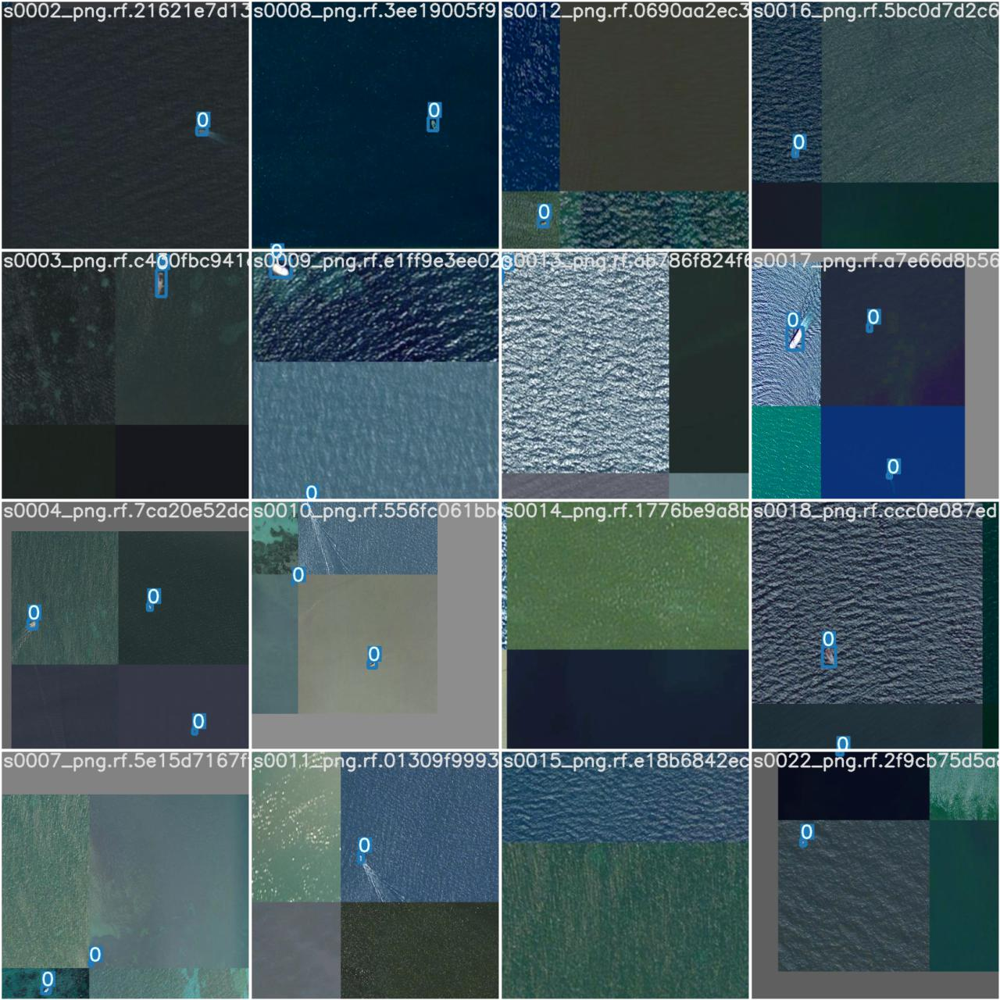

In [ ]:
# first, display our ground truth data
print("GROUND TRUTH TRAINING DATA:")
#Image(filename='./test_batch0_gt.jpg', width=900)
#Image(filename='./trin_batch0.jpg', width=900)
Image(filename='/content/yolov5/runs/exp0_yolov5s_results/train_batch0.jpg', width=900)


# **Jalankan Deteksi Kapal Laut Secara Visual & Detail**


In [ ]:
# when we ran this, we saw .007 second inference time. That is 140 FPS on a TESLA P100!
# use the best weights!
%cd /content/yolov5/
!python detect.py --weights runs/exp0_yolov5s_results/weights/best.pt --img 416 --conf 0.2 --source ../test/images

/content/yolov5
Namespace(agnostic_nms=False, augment=False, classes=None, conf_thres=0.2, device='', img_size=416, iou_thres=0.45, save_conf=False, save_dir='inference/output', save_txt=False, source='../test/images', update=False, view_img=False, weights=['runs/exp0_yolov5s_results/weights/best.pt'])
Using CUDA device0 _CudaDeviceProperties(name='Tesla T4', total_memory=15079MB)

Fusing layers... 
Model Summary: 140 layers, 7.24652e+06 parameters, 0 gradients
image 1/108 /content/test/images/s0005_png.rf.ca7b94edcf615656b530fbb153f0ab86.jpg: 416x416 1 ships, Done. (0.012s)
image 2/108 /content/test/images/s0019_png.rf.80e2bf23df4355411012fb7dc38d0b94.jpg: 416x416 1 ships, Done. (0.009s)
image 3/108 /content/test/images/s0021_png.rf.a5cc847b47b2f4aca5d064cf013252d9.jpg: 416x416 Done. (0.008s)
image 4/108 /content/test/images/s0054_png.rf.902bd289ed4c1d39dca6b945cf323c43.jpg: 416x416 1 ships, Done. (0.009s)
image 5/108 /content/test/images/s0074_png.rf.70f657a0c7ea568c213ae376e0bf2b2f.

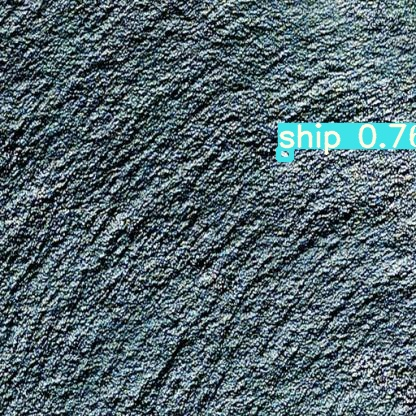

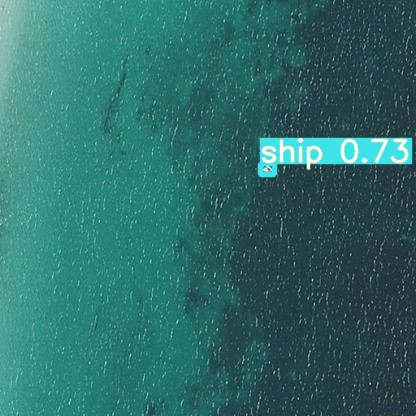

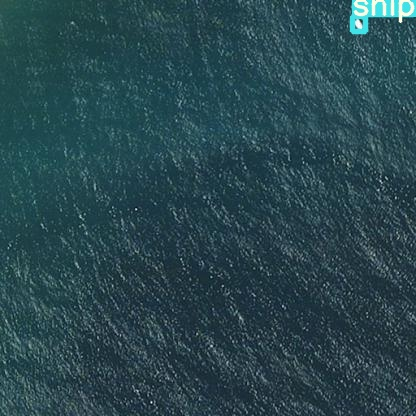

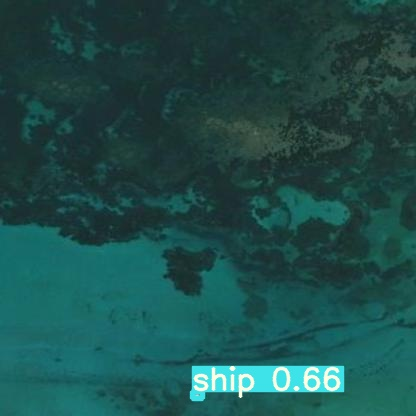

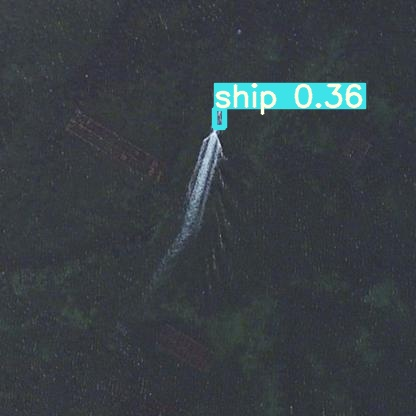

...

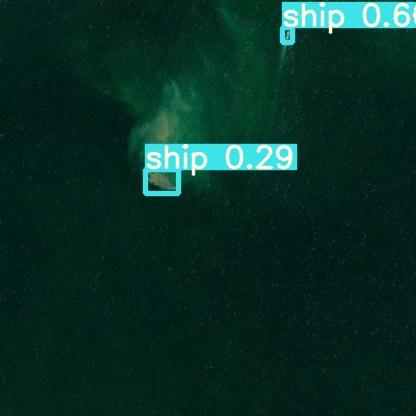

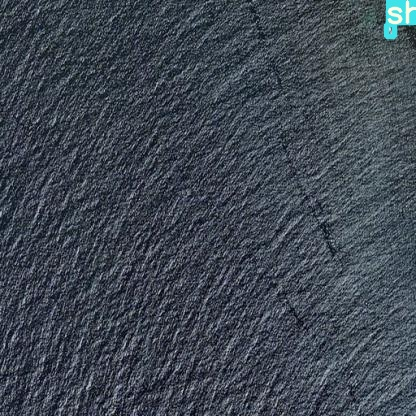

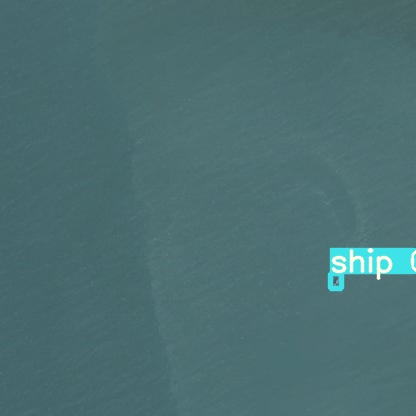

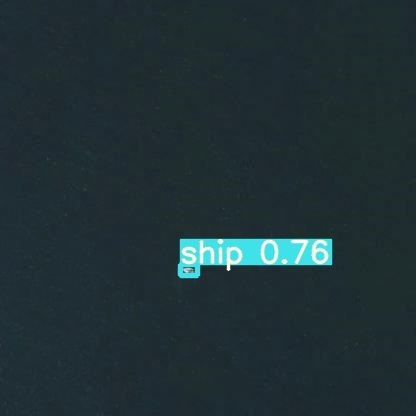

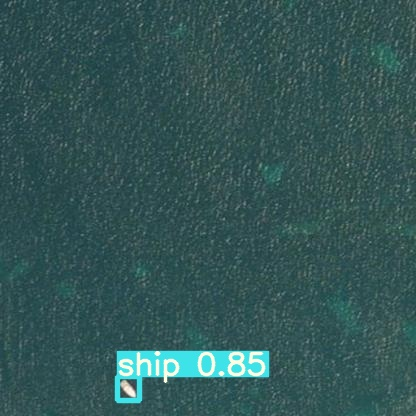

In [ ]:

import glob
from IPython.display import Image, display

for imageName in glob.glob('/content/yolov5/inference/output/*.jpg'): #assuming JPG
    display(Image(filename=imageName))
    print("\n")